# Advance Lane Finding project
###T his project is a simple solution to finding lanes for the Advance Lane Finding Project in the udacity nano degree. The steps followed are:
1. calibrate camera
2. Undistort Image
3. Color gradient
4. Alter perspective
5. Find lane pixels
    * Use sliding window
    * skip sliding window if previous best fit
6. Fit polinomial
7. Project results to original image



## Setup

In [181]:
import numpy as np
import pickle
import cv2
import glob
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline 

## 1. camera callibration
First we'll set up a LaneFinder class that will have the camera method and other useful attributes.
We will run the calibration everytime the class is instantiated inside the __init__ method.
We then store the output values in the class attributes. i.e self.ret, self.mtx, self.dist, self.rvecs, self.tvecs.

In [182]:
def calibrate():
    """Calibrates camera using the .jpg images in the ./camera_cal/ folder. Images start with calibration"""
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('./camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    undistorted_chessboards = []
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            undistorted_chessboards.append(img)
    #         
    img = cv2.imread('./camera_cal/calibration1.jpg')
    #Calibrate
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)

    return undistorted_chessboards, ret, mtx, dist, rvecs, tvecs



### Test calibration method

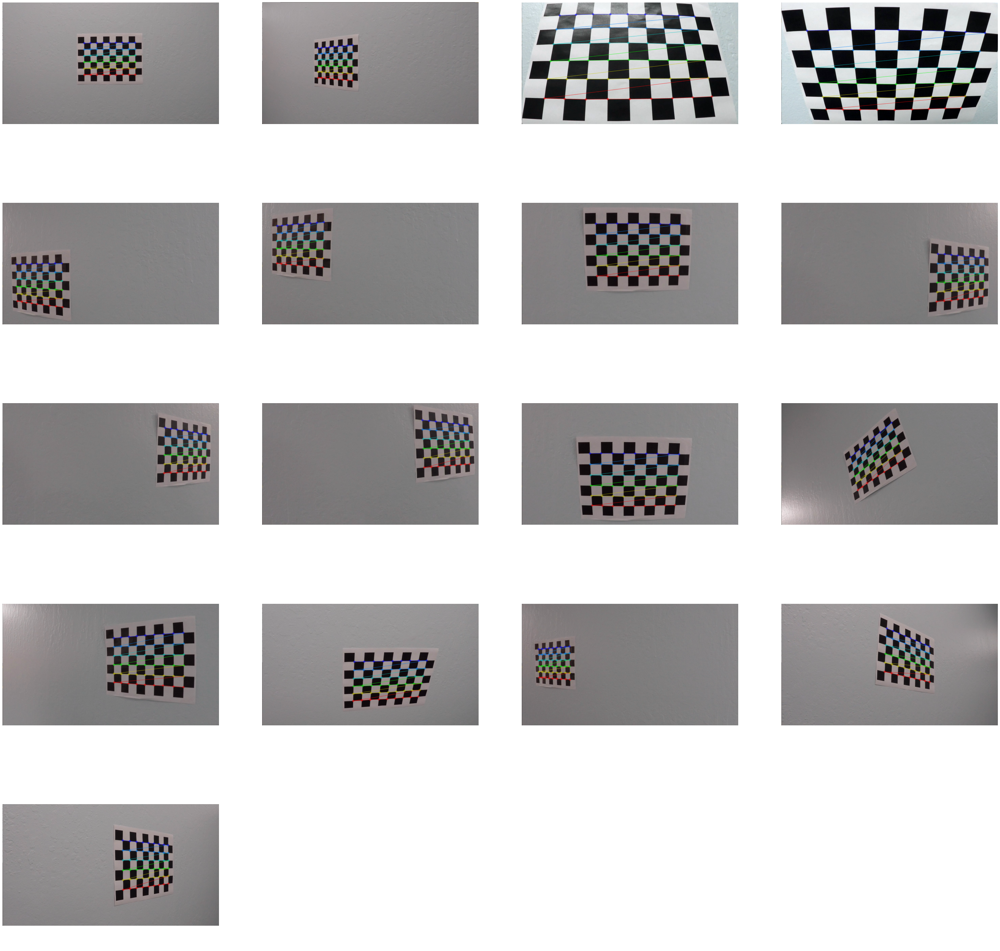

In [183]:
u_imgs, ret, mtx, dist, rvecs, tvecs = calibrate()

fig,axes = plt.subplots(nrows = 5, ncols = 4, figsize=(50,50))
for ax in axes.flatten():
    ax.axis('off')
    
for i, u_img, in enumerate(u_imgs):
    if i == 0:
        row = i
    else:
        row = i//4
    col = i-(row*4)
    axes[row,col].imshow(u_img)
plt.show()


## 2. Undistort Image
We now add the undistort method to the LaneFinder class

In [184]:
def undistort(img):    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist


### Test undistort

Text(0.5, 1.0, 'Undistorted')

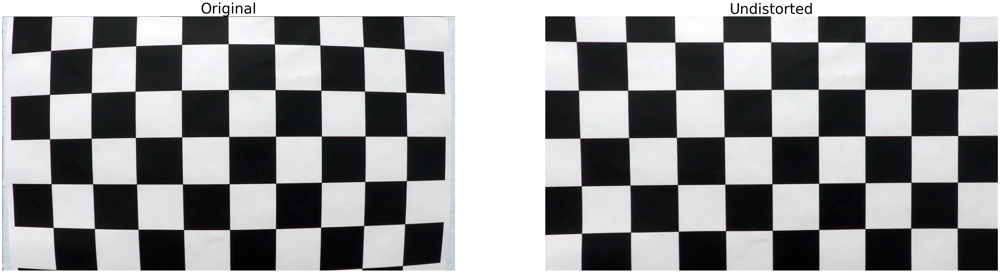

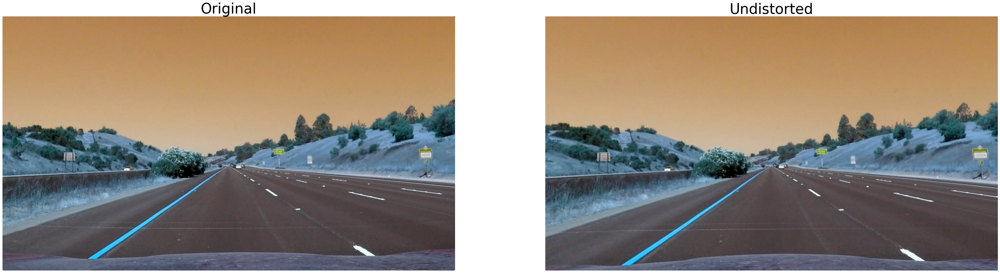

In [185]:
u_imgs, ret, mtx, dist, rvecs, tvecs = calibrate()
img = cv2.imread('./camera_cal/calibration1.jpg')
u_img = undistort(img)


f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(u_img)
x2.set_title('Undistorted', fontsize=40)

img = cv2.imread('./test_images/straight_lines1.jpg')
u_img = undistort(img)
f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(u_img)
x2.set_title('Undistorted', fontsize=40)



## 3. Color Gradient
He we use change the color of the image to more clear see the lane lines. We'll use gray scale, HLS, and the stack the into one image.

In [1106]:
def color_and_gradient(img_undistorted, s_thresh=(170, 255), grad_thresh=(20, 255)):
    img = np.copy(img_undistorted)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # S channel
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= 80) & (s_channel <= 255)] = 1

    # Absolute X sobel
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) 
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    sobelx_binary = np.zeros_like(scaled_sobelx)
    sobelx_binary[(scaled_sobelx >= 20) & (scaled_sobelx <= 255)] = 1

    # Magnitude
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Take the derivative in y
    grad_sobel = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*grad_sobel/np.max(grad_sobel))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= 20) & (scaled_sobel <= 255)] = 1

    # Direction
    sobelx_abs = np.absolute(sobelx)
    sobely_abs = np.absolute(sobely)
    dir_sobel = np.arctan2(sobelx_abs, sobely_abs)
    dir_binary =  np.zeros_like(dir_sobel)
    dir_binary[(dir_sobel >= 1) & (dir_sobel <= 0.09)] = 1
    
    # B of Lab channel
    b_channel = lab[:,:,2]
    if np.max(b_channel) > 175:
        lab_b = b_channel*(255/np.max(b_channel))
    b_binary = np.zeros_like(b_channel)
    b_binary[((b_channel > 160) & (b_channel <= 255))] = 1    
    
    # L channel
    l_channel = hls[:,:,1]
    l_channel = l_channel*(255/np.max(l_channel))
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel > 190) & (l_channel <= 255)] = 1
    
    # HSV channel
    v_channel = hls[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= 220) & (v_channel <= 255)] = 1
   
    # combine color and gradient image
    cg_img = np.zeros_like(mag_binary)
    
#     cg_img[(s_binary == 1)] = 1
#     cg_img[(mag_binary == 1) & (sobelx_binary == 1) & (dir_binary == 1)] = 1

    cg_img[(l_binary == 1) | (b_binary == 1) | (v_binary == 1)] = 1
    
    kernel = np.ones((2,2),np.uint8)
    cg_img = cv2.morphologyEx(cg_img, cv2.MORPH_OPEN, kernel)
    
    return cg_img

Text(0.5, 1.0, 'Color and Gradient 2')

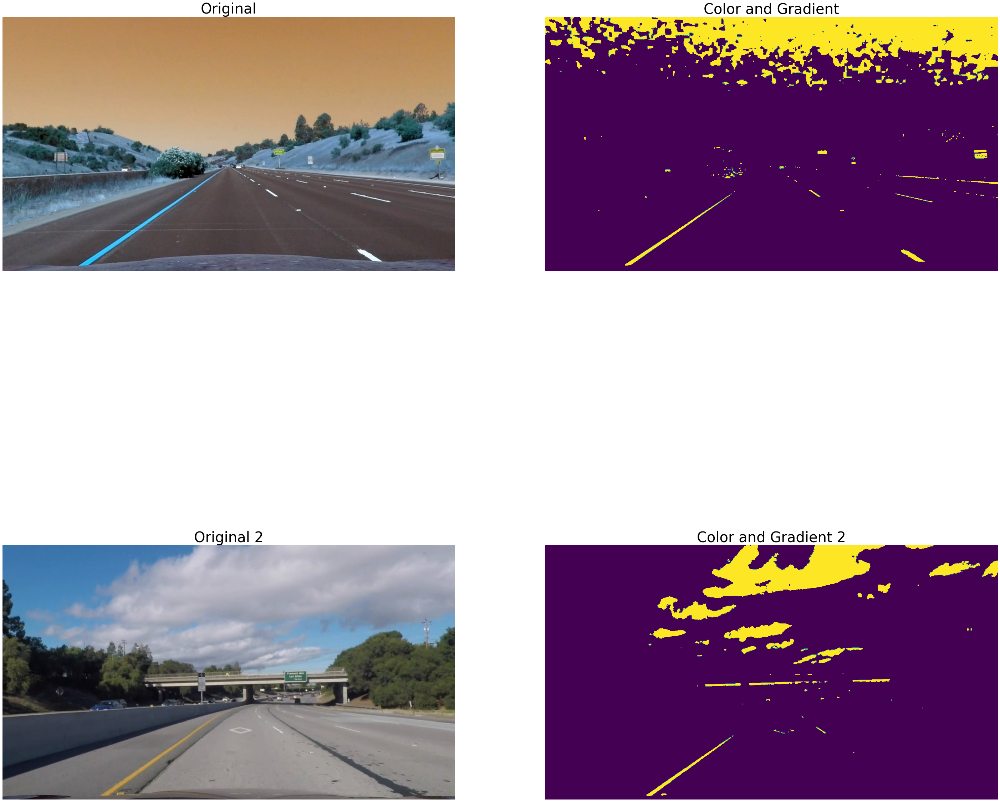

In [1176]:
img = cv2.imread('./test_images/straight_lines1.jpg')
u_img = undistort(img)
cg_img = color_and_gradient(u_img)


f, (x1, x2) = plt.subplots(2, 2, figsize=(50, 50))
x1[0].axis('off')
x1[0].imshow(u_img)
x1[0].set_title('Original', fontsize=40)

x1[1].axis('off')
x1[1].imshow(cg_img)
x1[1].set_title('Color and Gradient', fontsize=40)

img = cv2.imread('./test_images/test_43.jpg')
u_img = undistort(img)
cg_img = color_and_gradient(u_img)

x2[0].axis('off')
x2[0].imshow(u_img)
x2[0].set_title('Original 2', fontsize=40)

x2[1].axis('off')
x2[1].imshow(cg_img)
x2[1].set_title('Color and Gradient 2', fontsize=40)


## Alter perspective
Change perspective to top.

In [1028]:
def alter_perspective(cg_img, edges=(9,6)):
    img = cg_img
    #Hyper parameters for perspective distortion     
    top_right = (705, 450)
    top_left = (565, 450)
    bottom_right = (1200, 670)
    bottom_left = (0, 680)

    img_size = (img.shape[1], cg_img.shape[0])
    width = img.shape[1]
    height = img.shape[0]
    # Quadrangle verties coordinates in the source image
    s1 = [width // 2 - 76, height * 0.625]
    s2 = [width // 2 + 76, height * 0.625]
    s3 = [-100, height]
    s4 = [width + 100, height]
    src = np.float32([s1, s2, s3, s4])
    # Quadrangle verties coordinates in the destination image
    d1 = [100, 0]
    d2 = [width - 100, 0]
    d3 = [100, height]
    d4 = [width - 100, height]
    dst = np.float32([d1, d2, d3, d4])    

    M = cv2.getPerspectiveTransform(src, dst)
    Mrec = cv2.getPerspectiveTransform(dst, src)
    top_perspective_img = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)    
    return top_perspective_img, Mrec

Text(0.5, 1.0, 'Perspective')

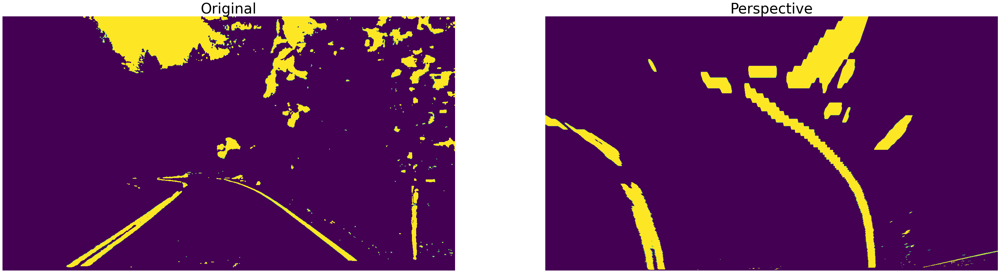

In [1114]:

img = cv2.imread('./test_images/test20.jpg')
u_img = undistort(img)
cg_img = color_and_gradient(u_img)

altered_img, Mrec = alter_perspective(cg_img)
%matplotlib inline
f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(cg_img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(altered_img)
x2.set_title('Perspective', fontsize=40)

## Find Lane Pixels
### Sliding window


In [1364]:
def sliding_window_search(altered_img):
    binary_warped = altered_img
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    midpoint = np.int(histogram.shape[0]//2)
    q_point = np.int(midpoint//2)
    eighth = np.int(q_point//2)
    leftx_base = np.argmax(histogram[eighth:int(q_point+eighth)])+eighth
    rightx_base = np.argmax(histogram[midpoint:(midpoint+q_point)]) + midpoint

    plt.plot(histogram)

    nwindows = 10
    margin = 80
    minpix = 30

    window_height = np.int(binary_warped.shape[0]//nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    leftx_current = leftx_base
    rightx_current = rightx_base

    left_lane_inds = []
    right_lane_inds = []
    
    delta_h = 0
    # Step through the windows one by one
    win_y_high = binary_warped.shape[0] 
    win_y_low = win_y_high - window_height #- window_height)
    
                 
    for window in range(nwindows):
        win_y_low -= delta_h
        win_y_high -= delta_h        
        
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin 
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin 
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2)        

        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        l_delta = 0
        delta_h = 70

        if len(good_left_inds):
            temp_leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            l_delta = leftx_current - temp_leftx_current
            delta_h = abs(int(window_height * abs(l_delta)/7))
            if (l_delta < -11):
                leftx_current += abs(l_delta)+10
            else:
                leftx_current -= abs(l_delta)+10
    
        if len(good_right_inds):        
            temp_rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            r_delta = rightx_current - temp_rightx_current
            mn = abs((l_delta+r_delta)/2)
            sqrt = 1/np.sqrt(mn)
            delta_h = abs(int(window_height * sqrt))            
            if (r_delta < -10):
                rightx_current += abs(r_delta)+10
            else:
                rightx_current -= abs(r_delta)+10

    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    #Polyfit
    left_fit = np.array([0,0,0], dtype='float') 
    right_fit = np.array([0,0,0], dtype='float') 
    
    if leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    return out_img, (leftx, lefty), (rightx, righty), left_fit, right_fit, ploty, left_fitx, right_fitx

648 720 0
607 679 41
422 494 185
1 73 421
15.5
-17 55 18
5.0
-49 23 32
14.5
-29 579
-67 5 18
-137 -65 70
-207 -135 70
-277 -205 70


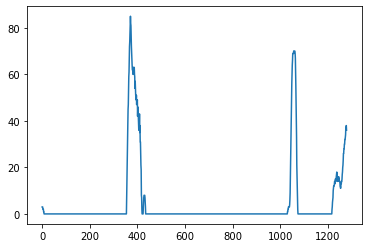

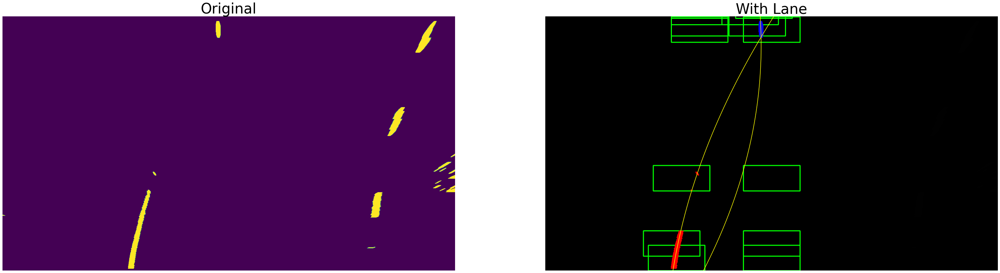

In [1366]:

img = cv2.imread('./test_images/test6.jpg')
u_img = undistort(img)
cg_img = color_and_gradient(u_img)
altered_img, Mrec = alter_perspective(cg_img)
result_img, (leftx, lefty), (rightx, righty), left_fit, right_fit, ploty, left_fitx, right_fitx = sliding_window_search(altered_img)


f, (x1, x2) = plt.subplots(1, 2, figsize=(50, 50))
x1.axis('off')
x1.imshow(altered_img)
x1.set_title('Original', fontsize=40)

x2.axis('off')
x2.imshow(result_img)
x2.set_title('With Lane', fontsize=40)
x2.plot(left_fitx, ploty, color='yellow')
x2.plot(right_fitx, ploty, color='yellow')

## Calculate curvature and absolute position

In [192]:
def measure_curvature_real():
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    y_eval = np.max(ploty) * ym_per_pix

    left_fit_scaled = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_scaled = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)


    left_curverad = ((1 + (2 * left_fit_scaled[0] * y_eval  + left_fit_scaled[1])**2)**1.5)/np.absolute(2*left_fit_scaled[0])  ## Implement the calculation of the left line here
    right_curverad =  ((1 + (2 * right_fit_scaled[0] * y_eval + right_fit_scaled[1])**2)**1.5)/np.absolute(2*right_fit_scaled[0])  ## Implement the calculation of the right line here

    right_pos = (left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2])
    left_pos = (right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2])
    centre_pos = (right_pos + left_pos)/2
    centre_diff = ((result_img.shape[1]/2) - centre_pos) * xm_per_pix

    return left_curverad, right_curverad, centre_diff 

## Draw resulting image unto the original image

In [559]:
def draw_lane(warped):        
        M = Mrec
        
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
            

        # Create an image to draw the lines on
        warped_binary = np.zeros_like(warped).astype(np.uint8)
        out_img = warped

        # Recast the x and y points into usable format for cv2.fillPoly()
        left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        left_right = np.hstack((left, right))

        # Draw the lane onto the warped blank image
        cv2.polylines(out_img, np.int32([left]), False, (255,0,255), 15)
        cv2.polylines(out_img, np.int32([right]), False, (0,0,255), 15)
        cv2.fillPoly(out_img, np.int_([left_right]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        out = cv2.warpPerspective(out_img, M, (img.shape[1], img.shape[0])) 
        
        left_curve_txt = "Left Radius: "+ str(int(left_curverad))+ "m"
        right_curve_txt = "Right Radius: "+ str(int(right_curverad))+ "m"
        centre_txt = "Car is: {:.2f}".format(centre_diff) + "m off centre"

        cv2.putText(img, left_curve_txt, (100,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        cv2.putText(img, right_curve_txt, (100,100), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255), 2)
        cv2.putText(img, centre_txt, (100,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2 )

        # Combine the result with the original image
        marked_lane_img = cv2.addWeighted(img, 1, out, 0.3, 0)
        return marked_lane_img


648 720 0
10.0
-12 930
626 698 22
13.5
607 679 19
4.5
574 646 33
22.5
-23 912
559 631 15
8.5
535 607 24
13.5
516 588 19
14.0
-28 905
497 569 19
5.5
467 539 30
397 469 70
1.5


Text(0.5, 1.0, 'Original')

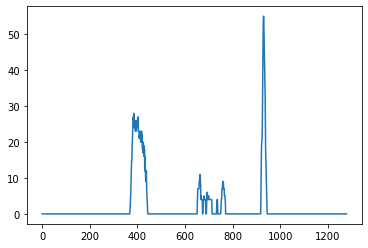

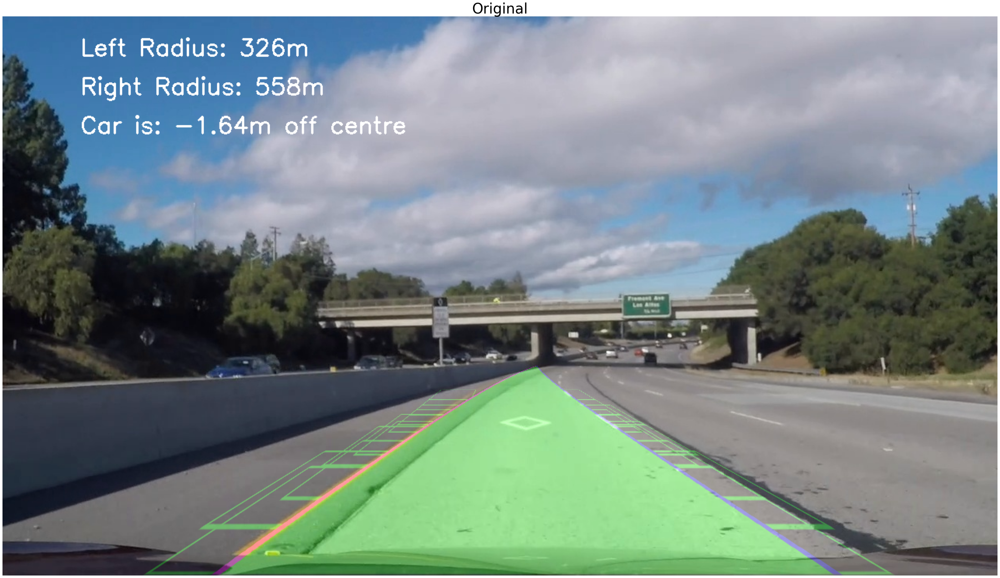

In [1367]:
img = cv2.imread('./test_images/test_43.jpg')
u_img = undistort(img)
cg_img = color_and_gradient(u_img)
altered_img, Mrec = alter_perspective(cg_img)
result_img, (leftx, lefty), (rightx, righty), left_fit, right_fit, ploty, left_fitx, right_fitx = sliding_window_search(altered_img)

left_curverad, right_curverad, centre_diff = measure_curvature_real()
marked_lane_img = draw_lane(result_img)
f, (x) = plt.subplots(1, 1, figsize=(50, 50))
x.figsize = (50, 50)
x.axis('off')
x.imshow(marked_lane_img)
x.set_title('Original', fontsize=40)

## Combine everything into a neat package
We'll now combine all those methods above into one class. 
We'll also refactor add a few more things:
* Skipping the sliding window for subsequents images for video
* Sanity check for lane lines (check best fit)


In [1399]:
import numpy as np
import pickle
import cv2
import glob
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque

%matplotlib inline 
 
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self, allx=None, ally=None):
        # was the line detected in the last iteration?
        self.detected = False     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #x values for detected line pixels
        self.allx = allx
        #y values for detected line pixels
        self.ally = ally 
        # consercurtive bad fit count
        self.bad_fit_count = 0
            
    def add_best_fit(self, new_fit):
        self.best_fit = new_fit
        self.current_fit.append(new_fit)
        if len(self.current_fit)> 4:
            # Smoothing
            self.best_fit = np.average(self.current_fit, axis=0)
        self.detected = True
                
    def check_fit(self, new_fit): 
        if new_fit.any():
            if self.best_fit is None:
                return self.add_best_fit(new_fit)
            else:
                delta_fit = abs(new_fit - self.best_fit)
 
                if ((delta_fit[0] < 0.00001 or delta_fit[1] < 0.0001) or delta_fit[2] < 100.) and len(self.current_fit) < 0:
                    return self.add_best_fit(new_fit)
        self.detected = False
        self.bad_fit_count += 1
        if self.bad_fit_count > 4:
            self.bad_fit_count = 0
            self.current_fit = [np.array([False])]
            self.best_fit = None
#         else:    
#             if len(self.current_fit) > 0:
#                 mean_fit = np.average(self.current_fit, axis=0)
    #             self.best_fit = mean_fit
#                 self.current_fit.append(mean_fit)
        
        

class LaneFinder:
    def __init__(self):
        self.img = None
        self.cg_img = None
        self.top_perspective_img = None
        self.M = None
        self.left_lane = Line()
        self.right_lane = Line()
        self.nwindows = 9
        self.left_fit =  np.array([0,0,0], dtype='float') 
        self.right_fit =  np.array([0,0,0], dtype='float') 
        self.poly_fitted_img = None
        self.marked_lane_img = None
        self.nwindows = 9
        self.margin = 80
        self.minpix = 10
        self.left_rad = 0
        self.right_rad = 0
        self.centre_dist = 0
        self.ym_per_pix = 30/720
        self.xm_per_pix = 3.7/700
        self.diff_Left_right = 0
        self.deviation = 0
        self.calibrate()


    def find_lane(self, img):
        self.img = img
        self.prepare_img()
        
        if not self.left_lane.detected or not self.right_lane.detected:
            self.sliding_window_search()
        else:
            self.search_around_poly()
        self.fit_polynomial()
        self.draw_lane()
        return self.marked_lane_img
        
    def calibrate(self):
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((6*9,3), np.float32)
        objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.

        # Make a list of calibration images
        images = glob.glob('./camera_cal/calibration*.jpg')

        # Step through the list and search for chessboard corners
        for fname in images:
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

            # If found, add object points, image points
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)

                # Draw and display the corners
                img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #         cv2.imshow('img',img)
        img = cv2.imread(images[0])
        #Calibrate
        self.ret, self.mtx, self.dist, self.rvecs, self.tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)
    
    def prepare_img(self):
        img_undistorted = self.undistort()
        self.color_and_gradient(img_undistorted)
        self.alter_perspective()


    def undistort(self):    
        self.undist = cv2.undistort(self.img, self.mtx, self.dist, None, self.mtx)
        return self.undist

    def alter_perspective(self, edges=(9,6)):
        img = self.cg_img
        #Hyper parameters for perspective distortion     
        top_right = (725, 455)
        top_left = (555, 455)
        bottom_right = (1280, 680)
        bottom_left = (0, 680)
        
        img_size = (img.shape[1], img.shape[0])
        src = np.float32([[top_right], [top_left], [bottom_right], [bottom_left]])
        dst = np.float32([[img.shape[1], 0], [0,0], 
                                     [img.shape[1], img.shape[0]], 
                                     [0, img.shape[0]]])    
        
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.Mrec = cv2.getPerspectiveTransform(dst, src)
        self.top_perspective_img = cv2.warpPerspective(img, self.M, img_size, flags=cv2.INTER_LINEAR)
        
        return self.top_perspective_img, self.Mrec

    def color_and_gradient(self, img_undistorted):
        img = np.copy(img_undistorted)
        # Convert to HLS color space and separate the V channel
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
        hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

        # B of Lab channel
        b_channel = lab[:,:,2]
        if np.max(b_channel) > 175:
            lab_b = b_channel*(255/np.max(b_channel))
        b_binary = np.zeros_like(b_channel)
        b_binary[((b_channel > 160) & (b_channel <= 255))] = 1    

        # L channel
        l_channel = hls[:,:,1]
        l_channel = l_channel*(255/np.max(l_channel))
        l_binary = np.zeros_like(l_channel)
        l_binary[(l_channel > 190) & (l_channel <= 255)] = 1

        # HSV channel
        v_channel = hls[:,:,2]
        v_binary = np.zeros_like(v_channel)
        v_binary[(v_channel >= 220) & (v_channel <= 255)] = 1

        # combine color and gradient image
        self.cg_img = np.zeros_like(l_binary)
        self.cg_img[(l_binary == 1) | (b_binary == 1) |  (v_binary == 1)] = 1
        
        kernel = np.ones((2,2),np.uint8)
        self.cg_img = cv2.morphologyEx(self.cg_img, cv2.MORPH_OPEN, kernel)
        
        return self.cg_img

    def sliding_window_search(self):
        perspective_img = self.top_perspective_img
        histogram = np.sum(perspective_img[perspective_img.shape[0]//2:,:], axis=0)
        poly_fitted_img = np.dstack((perspective_img, perspective_img, perspective_img))
        midpoint = np.int(histogram.shape[0]//2)
        q_point = np.int(midpoint//2)
        eighth = np.int(q_point//2)
        leftx_base = np.argmax(histogram[eighth:int(q_point+eighth)])+eighth
        rightx_base = np.argmax(histogram[midpoint:(midpoint+q_point+eighth)]) + midpoint

        window_height = np.int(perspective_img.shape[0]//self.nwindows)
        nonzero = perspective_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        leftx_current = leftx_base
        rightx_current = rightx_base
        self.diff_left_right = abs(leftx_base - rightx_base)
        self.deviation = 0

        left_lane_inds = []
        right_lane_inds = []
        
        margin = self.margin

        delta_h = 0
        # Step through the windows one by one
        win_y_high = perspective_img.shape[0] 
        win_y_low = win_y_high - window_height #- window_height)


        for window in range(self.nwindows):
            win_y_low -= delta_h
            win_y_high -= delta_h        

            win_xleft_low = leftx_current - margin  
            win_xleft_high = leftx_current + margin 
            win_xright_low = rightx_current - margin  
            win_xright_high = rightx_current + margin 
            
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            l_delta = 0
            delta_h = 70

            if len(good_left_inds):
                temp_leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
                l_delta = leftx_current - temp_leftx_current
                delta_h = abs(int(window_height * abs(l_delta)/7))
                if (l_delta < -11):
                    leftx_current += abs(l_delta)+10
                else:
                    leftx_current -= abs(l_delta)+10

            if len(good_right_inds):        
                temp_rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
                r_delta = rightx_current - temp_rightx_current
                mean_delta = abs((l_delta+r_delta)/2)
                mean_delta = 1/np.sqrt(mean_delta)
                if not np.isfinite(mean_delta):
                    mean_delta = 1
                delta_h = abs(int(window_height * mean_delta))            
                if (r_delta < -10):
                    rightx_current += abs(r_delta)+10
                else:
                    rightx_current -= abs(r_delta)+10
            
                
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        self.left_lane = Line(leftx, lefty)
        self.right_lane = Line(rightx, righty)
        
        return self.poly_fitted_img
    
    def fit_polynomial(self): 
        left_fit = np.array([0,0,0], dtype='float')
        right_fit = np.array([0,0,0], dtype='float')
        
        perspective_img = np.zeros_like(self.top_perspective_img).astype(np.uint8)
        self.poly_fitted_img = np.dstack((perspective_img, perspective_img, perspective_img))
        
        if self.left_lane.allx.any():
            left_fit = np.polyfit(self.left_lane.ally, self.left_lane.allx, 2)
                
        if self.right_lane.allx.any():
            right_fit = np.polyfit(self.right_lane.ally, self.right_lane.allx, 2)
        
        # Calculate curvature radius
        
        l_rad, r_rad = self.measure_curvature_real(left_fit, right_fit)
        
        if self.right_lane.allx.any() and self.left_lane.allx.any():
            cur_diff_Left_right = self.right_lane.allx[-1] - self.left_lane.allx[-1]
            if (self.diff_Left_right-cur_diff_Left_right) > 100 or cur_diff_Left_right < 100:
                left_fit = np.array([0,0,0], dtype='float')
                right_fit = np.array([0,0,0], dtype='float')
            self.diff_Left_right = cur_diff_Left_right
                
        
        # Perform additional sanity checks then add best_fit
        self.left_lane.check_fit(left_fit)
        self.right_lane.check_fit(right_fit)


    def search_around_poly(self):
        margin = self.margin

        # Grab activated pixels
        perspective_img = self.top_perspective_img
        nonzero = perspective_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        left_lane_inds = ((nonzerox > (self.left_lane.best_fit[0]*(nonzeroy**2) + self.left_lane.best_fit[1]*nonzeroy + 
                        self.left_lane.best_fit[2] - margin)) & (nonzerox < (self.left_lane.best_fit[0]*(nonzeroy**2) + 
                        self.left_lane.best_fit[1]*nonzeroy + self.left_lane.best_fit[2] + margin)))
        right_lane_inds = ((nonzerox > (self.right_lane.best_fit[0]*(nonzeroy**2) + self.right_lane.best_fit[1]*nonzeroy + 
                        self.right_lane.best_fit[2] - margin)) & (nonzerox < (self.right_lane.best_fit[0]*(nonzeroy**2) + 
                        self.right_lane.best_fit[1]*nonzeroy + self.right_lane.best_fit[2] + margin)))

        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        if rightx.any() and leftx.any():
            cur_diff_Left_right = max(rightx) - min(leftx)
            if cur_diff_Left_right > 200:
                leftx, lefty = None, None
                rightx, righty = None, None
            else:
                self.left_lane = Line(leftx, lefty)
                self.right_lane = Line(rightx, righty)


    def measure_curvature_real(self, left_fit, right_fit):
        self.ploty = np.linspace(0, self.img.shape[0]-1, self.top_perspective_img.shape[0])
        ploty = self.ploty
        '''
        Calculates the curvature of polynomial functions in meters.
        '''

        xm_per_pix = self.xm_per_pix
        ym_per_pix = self.ym_per_pix
        
        self.y_eval = np.max(self.ploty) * ym_per_pix
        y_eval = self.y_eval
        
        
        try:
            self.left_fit_scaled = np.polyfit(self.left_lane.ally*ym_per_pix, self.left_lane.allx*xm_per_pix, 2)
            self.right_fit_scaled = np.polyfit(self.right_lane.ally*ym_per_pix, self.right_lane.allx*xm_per_pix, 2)
            self.left_rad = ((1 + (2 * self.left_fit_scaled[0] * y_eval  + self.left_fit_scaled[1])**2)**1.5)/np.absolute(2*self.left_fit_scaled[0])  ## Implement the calculation of the left line here
            self.right_rad =  ((1 + (2 * self.right_fit_scaled[0] * y_eval + self.right_fit_scaled[1])**2)**1.5)/np.absolute(2*self.right_fit_scaled[0])  ## Implement the calculation of the right line here
        except:
            self.left_fit_scaled = self.left_fit
            self.right_fit_scaled = self.right_fit
        return self.left_rad, self.right_rad
    
    def calc_centre_dist(self):
        y_eval = self.y_eval
        right_pos = (self.left_fit_scaled[0]*y_eval**2 + self.left_fit_scaled[1]*y_eval + self.left_fit_scaled[2])
        left_pos = (self.right_fit_scaled[0]*y_eval**2 + self.right_fit_scaled[1]*y_eval + self.right_fit_scaled[2])
        centre_pos = (right_pos + left_pos)/2
        self.centre_dist = ((self.poly_fitted_img.shape[1]* self.xm_per_pix/2) - centre_pos) 
        
        return self.centre_dist

    def draw_lane(self):
        img = self.img
        
        warped = self.poly_fitted_img
        M = self.Mrec
        left_fit = self.left_lane.best_fit
        right_fit = self.right_lane.best_fit
        ploty = self.ploty
        
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except Exception:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
#             print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty


        # Create an image to draw the lines on
        warped_binary = np.zeros_like(warped).astype(np.uint8)
        out_img = warped

        # Recast the x and y points into usable format for cv2.fillPoly()
        left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        left_right = np.hstack((left, right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(out_img, np.int_([left_right]), (0,255, 0))
        cv2.polylines(out_img, np.int32([left]), 0, (255,0,255), 15)
        cv2.polylines(out_img, np.int32([right]), 0, (0,0,255), 15)

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        out = cv2.warpPerspective(out_img, M, (img.shape[1], img.shape[0])) 
        
        left_rad, right_rad =  self.left_rad, self.right_rad
        centre_dist = self.calc_centre_dist()
        left_curve_txt = "Left Radius: "+ str(int(left_rad))+ "m"
        right_curve_txt = "Right Radius: "+ str(int(right_rad))+ "m"
        centre_txt = "Car is: {:.2f}".format(centre_dist) + "m off centre"

        cv2.putText(img, left_curve_txt, (100,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        cv2.putText(img, right_curve_txt, (100,100), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255), 2)
        cv2.putText(img, centre_txt, (100,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2 )

        # Combine the result with the original image
        self.marked_lane_img = cv2.addWeighted(img, 1, out, 0.4, 0)
        return self.marked_lane_img




## Test on Image

1.0 80 80.0
0.23249527748763857 80 18.599622199011087
0.3244428422615251 80 25.955427380922007
0.22360679774997896 80 17.88854381999832
0.4082482904638631 80 32.65986323710904
0.6324555320336759 80 50.59644256269407
0.47140452079103173 80 37.712361663282536


Text(0.5, 1.0, 'Original')

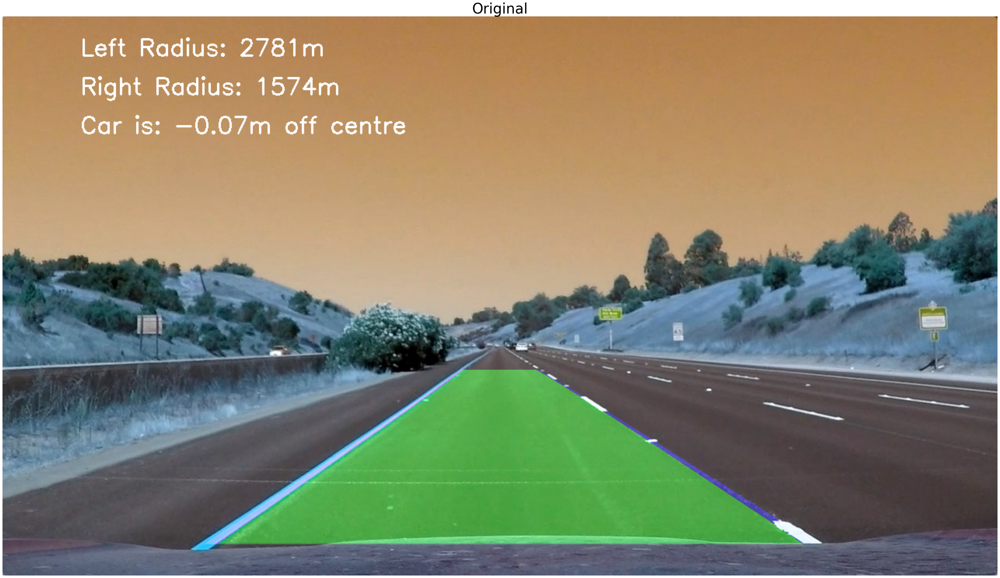

In [1394]:
img = cv2.imread('./test_images/straight_lines1.jpg')
lane_finder = LaneFinder()
marked_lane_img = lane_finder.find_lane(img)
f, (x) = plt.subplots(1, 1, figsize=(50, 50))
x.figsize=(50, 50)
x.axis('off')
x.imshow(marked_lane_img)
x.set_title('Original', fontsize=40)


## Test on Video

In [1400]:
lane_finder = LaneFinder()

from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip


def find_lane_video():
    video_output = 'harder_challenge_video_output.mp4'
    clip1 = VideoFileClip("harder_challenge_video.mp4")
    video_clip = clip1.fl_image(lane_finder.find_lane)
    %time video_clip.write_videofile(video_output, audio=False)

    HTML("""
    <video width="960" height="540" controls>
      <source src="{0}">
    </video>  
    """.format(video_output))

find_lane_video()






                                                  


                                                    

                                                       
                                                               



t:   2%|▏         | 26/1199 [00:23<04:49,  4.05it/s, now=None]


t:   2%|▏         | 11/485 [07:06<02:12,  3.59it/s, now=None]

t:  16%|█▌        | 192/1199 [30:10<02:29,  6.75it/s, now=None]A



                                                  


                                                    

                                                       
                                                               



t:   2%|▏         | 26/1199 [00:24<04:49,  4.05it/s, now=None]


t:   2%|▏         | 11/485 [07:06<02:12,  3.59it/s, now=None]

t:  16%|█▌        | 192/1199 [30:10<02:29,  6.75it/s, now=None]A




t:   0%|          | 0/1199 [00:00<?, ?it/s, now=None]

Moviepy - Building video harder_challenge_video_output.mp4.
Moviepy - Writing video harder_challenge_video_output.mp4








t:   0%|          | 2/1199 [00:00<02:34,  7.74it/s, now=None]




t:   0%|          | 3/1199 [00:00<04:07,  4.83it/s, now=None]




t:   0%|          | 4/1199 [00:01<06:05,  3.27it/s, now=None]




t:   0%|          | 5/1199 [00:01<06:05,  3.27it/s, now=None]




t:   1%|          | 6/1199 [00:01<07:15,  2.74it/s, now=None]




t:   1%|          | 7/1199 [00:02<06:54,  2.87it/s, now=None]




t:   1%|          | 8/1199 [00:02<06:02,  3.29it/s, now=None]




t:   1%|          | 9/1199 [00:02<06:46,  2.93it/s, now=None]




t:   1%|          | 10/1199 [00:03<06:12,  3.19it/s, now=None]




t:   1%|          | 11/1199 [00:03<07:08,  2.78it/s, now=None]




t:   1%|          | 12/1199 [00:03<06:12,  3.18it/s, now=None]




t:   1%|          | 13/1199 [00:04<06:17,  3.14it/s, now=None]




t:   1%|          | 14/1199 [00:04<05:48,  3.41it/s, now=None]




t:   1%|▏         | 15/1199 [00:04<05:53,  3.35it/s, now=None]




t:   1%|▏         | 16/1199 [00:04<05:24,  3.65it/s, now=None]




t:   8%|▊         | 101/1199 [00:23<04:20,  4.21it/s, now=None]




t:   9%|▊         | 102/1199 [00:23<04:23,  4.16it/s, now=None]




t:   9%|▊         | 103/1199 [00:24<04:27,  4.09it/s, now=None]




t:   9%|▊         | 104/1199 [00:24<04:10,  4.37it/s, now=None]




t:   9%|▉         | 105/1199 [00:24<04:01,  4.53it/s, now=None]




t:   9%|▉         | 106/1199 [00:24<03:59,  4.57it/s, now=None]




t:   9%|▉         | 107/1199 [00:25<04:00,  4.53it/s, now=None]




t:   9%|▉         | 108/1199 [00:25<04:03,  4.48it/s, now=None]




t:   9%|▉         | 109/1199 [00:25<04:17,  4.23it/s, now=None]




t:   9%|▉         | 110/1199 [00:25<04:28,  4.05it/s, now=None]




t:   9%|▉         | 111/1199 [00:26<04:34,  3.96it/s, now=None]




t:   9%|▉         | 112/1199 [00:26<04:13,  4.28it/s, now=None]




t:   9%|▉         | 113/1199 [00:26<04:09,  4.35it/s, now=None]




t:  10%|▉         | 114/1199 [00:26<03:59,  4.54it/s, now=None]




t:  10%|▉         | 115/1199 [00:26<03:53,  4.64

t:  17%|█▋        | 199/1199 [00:45<03:07,  5.33it/s, now=None]




t:  17%|█▋        | 200/1199 [00:45<03:14,  5.15it/s, now=None]




t:  17%|█▋        | 201/1199 [00:45<03:06,  5.35it/s, now=None]




t:  17%|█▋        | 202/1199 [00:45<03:11,  5.20it/s, now=None]




t:  17%|█▋        | 203/1199 [00:45<03:15,  5.10it/s, now=None]




t:  17%|█▋        | 204/1199 [00:46<03:38,  4.56it/s, now=None]




t:  17%|█▋        | 205/1199 [00:46<03:34,  4.62it/s, now=None]




t:  17%|█▋        | 206/1199 [00:46<03:36,  4.59it/s, now=None]




t:  17%|█▋        | 207/1199 [00:46<03:40,  4.50it/s, now=None]




t:  17%|█▋        | 208/1199 [00:47<04:00,  4.13it/s, now=None]




t:  17%|█▋        | 209/1199 [00:47<04:01,  4.10it/s, now=None]




t:  18%|█▊        | 210/1199 [00:47<03:49,  4.30it/s, now=None]




t:  18%|█▊        | 211/1199 [00:47<03:40,  4.48it/s, now=None]




t:  18%|█▊        | 212/1199 [00:48<03:53,  4.23it/s, now=None]




t:  18%|█▊        | 213/1199 [00:48<03:42,  4.43

t:  25%|██▍       | 297/1199 [01:08<03:25,  4.40it/s, now=None]




t:  25%|██▍       | 298/1199 [01:08<03:19,  4.52it/s, now=None]




t:  25%|██▍       | 299/1199 [01:08<03:18,  4.54it/s, now=None]




t:  25%|██▌       | 300/1199 [01:08<03:32,  4.22it/s, now=None]




t:  25%|██▌       | 301/1199 [01:09<03:21,  4.45it/s, now=None]




t:  25%|██▌       | 302/1199 [01:09<03:14,  4.61it/s, now=None]




t:  25%|██▌       | 303/1199 [01:09<03:24,  4.38it/s, now=None]




t:  25%|██▌       | 304/1199 [01:09<03:19,  4.50it/s, now=None]




t:  25%|██▌       | 305/1199 [01:10<03:23,  4.38it/s, now=None]




t:  26%|██▌       | 306/1199 [01:10<03:36,  4.13it/s, now=None]




t:  26%|██▌       | 307/1199 [01:10<03:29,  4.27it/s, now=None]




t:  26%|██▌       | 308/1199 [01:10<03:18,  4.49it/s, now=None]




t:  26%|██▌       | 309/1199 [01:10<03:08,  4.73it/s, now=None]




t:  26%|██▌       | 310/1199 [01:11<03:07,  4.75it/s, now=None]




t:  26%|██▌       | 311/1199 [01:11<03:03,  4.85

t:  33%|███▎      | 395/1199 [01:32<03:54,  3.43it/s, now=None]




t:  33%|███▎      | 396/1199 [01:32<03:48,  3.52it/s, now=None]




t:  33%|███▎      | 397/1199 [01:33<03:38,  3.67it/s, now=None]




t:  33%|███▎      | 398/1199 [01:33<03:36,  3.70it/s, now=None]




t:  33%|███▎      | 399/1199 [01:33<03:37,  3.68it/s, now=None]




t:  33%|███▎      | 400/1199 [01:34<03:44,  3.57it/s, now=None]




t:  33%|███▎      | 401/1199 [01:34<03:53,  3.42it/s, now=None]




t:  34%|███▎      | 402/1199 [01:34<04:07,  3.22it/s, now=None]




t:  34%|███▎      | 403/1199 [01:35<04:07,  3.21it/s, now=None]




t:  34%|███▎      | 404/1199 [01:35<03:55,  3.37it/s, now=None]




t:  34%|███▍      | 405/1199 [01:35<03:47,  3.49it/s, now=None]




t:  34%|███▍      | 406/1199 [01:35<03:50,  3.44it/s, now=None]




t:  34%|███▍      | 407/1199 [01:36<03:47,  3.48it/s, now=None]




t:  34%|███▍      | 408/1199 [01:36<03:52,  3.40it/s, now=None]




t:  34%|███▍      | 409/1199 [01:36<03:44,  3.52

t:  41%|████      | 493/1199 [02:01<03:37,  3.24it/s, now=None]




t:  41%|████      | 494/1199 [02:01<03:24,  3.46it/s, now=None]




t:  41%|████▏     | 495/1199 [02:01<03:06,  3.78it/s, now=None]




t:  41%|████▏     | 496/1199 [02:01<03:15,  3.60it/s, now=None]




t:  41%|████▏     | 497/1199 [02:02<03:15,  3.59it/s, now=None]




t:  42%|████▏     | 498/1199 [02:02<03:51,  3.03it/s, now=None]




t:  42%|████▏     | 499/1199 [02:02<03:22,  3.46it/s, now=None]




t:  42%|████▏     | 500/1199 [02:03<03:38,  3.20it/s, now=None]




t:  42%|████▏     | 501/1199 [02:03<03:43,  3.13it/s, now=None]




t:  42%|████▏     | 502/1199 [02:03<03:36,  3.22it/s, now=None]




t:  42%|████▏     | 503/1199 [02:04<03:22,  3.44it/s, now=None]




t:  42%|████▏     | 504/1199 [02:04<03:01,  3.84it/s, now=None]




t:  42%|████▏     | 505/1199 [02:04<02:59,  3.87it/s, now=None]




t:  42%|████▏     | 506/1199 [02:04<02:56,  3.94it/s, now=None]




t:  42%|████▏     | 507/1199 [02:05<02:53,  3.99

t:  49%|████▉     | 591/1199 [02:23<01:54,  5.31it/s, now=None]




t:  49%|████▉     | 592/1199 [02:23<01:53,  5.37it/s, now=None]




t:  49%|████▉     | 593/1199 [02:24<01:43,  5.87it/s, now=None]




t:  50%|████▉     | 594/1199 [02:24<01:39,  6.07it/s, now=None]




t:  50%|████▉     | 595/1199 [02:24<01:41,  5.93it/s, now=None]




t:  50%|████▉     | 596/1199 [02:24<01:40,  5.99it/s, now=None]




t:  50%|████▉     | 597/1199 [02:24<01:40,  5.97it/s, now=None]




t:  50%|████▉     | 598/1199 [02:24<01:40,  6.00it/s, now=None]




t:  50%|████▉     | 599/1199 [02:25<01:40,  5.99it/s, now=None]




t:  50%|█████     | 600/1199 [02:25<01:39,  5.99it/s, now=None]




t:  50%|█████     | 601/1199 [02:25<01:38,  6.07it/s, now=None]




t:  50%|█████     | 602/1199 [02:25<01:39,  5.98it/s, now=None]




t:  50%|█████     | 603/1199 [02:25<01:39,  6.01it/s, now=None]




t:  50%|█████     | 604/1199 [02:25<01:38,  6.03it/s, now=None]




t:  50%|█████     | 605/1199 [02:26<01:36,  6.13

t:  57%|█████▋    | 689/1199 [02:47<01:50,  4.61it/s, now=None]




t:  58%|█████▊    | 690/1199 [02:47<01:49,  4.65it/s, now=None]




t:  58%|█████▊    | 691/1199 [02:47<01:44,  4.84it/s, now=None]




t:  58%|█████▊    | 692/1199 [02:47<01:45,  4.83it/s, now=None]




t:  58%|█████▊    | 693/1199 [02:47<01:39,  5.10it/s, now=None]




t:  58%|█████▊    | 694/1199 [02:48<01:44,  4.83it/s, now=None]




t:  58%|█████▊    | 695/1199 [02:48<01:42,  4.93it/s, now=None]




t:  58%|█████▊    | 696/1199 [02:48<01:39,  5.04it/s, now=None]




t:  58%|█████▊    | 697/1199 [02:48<01:36,  5.19it/s, now=None]




t:  58%|█████▊    | 698/1199 [02:49<01:41,  4.92it/s, now=None]




t:  58%|█████▊    | 699/1199 [02:49<01:36,  5.19it/s, now=None]




t:  58%|█████▊    | 700/1199 [02:49<01:44,  4.77it/s, now=None]




t:  58%|█████▊    | 701/1199 [02:49<01:46,  4.68it/s, now=None]




t:  59%|█████▊    | 702/1199 [02:49<01:43,  4.82it/s, now=None]




t:  59%|█████▊    | 703/1199 [02:50<01:39,  4.97

t:  66%|██████▌   | 787/1199 [03:09<01:39,  4.13it/s, now=None]




t:  66%|██████▌   | 788/1199 [03:09<01:44,  3.93it/s, now=None]




t:  66%|██████▌   | 789/1199 [03:09<01:41,  4.02it/s, now=None]




t:  66%|██████▌   | 790/1199 [03:09<01:42,  3.98it/s, now=None]




t:  66%|██████▌   | 791/1199 [03:10<01:41,  4.01it/s, now=None]




t:  66%|██████▌   | 792/1199 [03:10<01:38,  4.14it/s, now=None]




t:  66%|██████▌   | 793/1199 [03:10<01:37,  4.15it/s, now=None]




t:  66%|██████▌   | 794/1199 [03:10<01:45,  3.85it/s, now=None]




t:  66%|██████▋   | 795/1199 [03:11<01:43,  3.89it/s, now=None]




t:  66%|██████▋   | 796/1199 [03:11<01:39,  4.05it/s, now=None]




t:  66%|██████▋   | 797/1199 [03:11<01:36,  4.17it/s, now=None]




t:  67%|██████▋   | 798/1199 [03:11<01:43,  3.87it/s, now=None]




t:  67%|██████▋   | 799/1199 [03:12<01:34,  4.21it/s, now=None]




t:  67%|██████▋   | 800/1199 [03:12<01:43,  3.86it/s, now=None]




t:  67%|██████▋   | 801/1199 [03:12<01:35,  4.17

t:  74%|███████▍  | 885/1199 [03:39<01:23,  3.74it/s, now=None]




t:  74%|███████▍  | 886/1199 [03:39<01:19,  3.92it/s, now=None]




t:  74%|███████▍  | 887/1199 [03:39<01:34,  3.30it/s, now=None]




t:  74%|███████▍  | 888/1199 [03:40<01:30,  3.44it/s, now=None]




t:  74%|███████▍  | 889/1199 [03:40<01:25,  3.64it/s, now=None]




t:  74%|███████▍  | 890/1199 [03:41<02:17,  2.25it/s, now=None]




t:  74%|███████▍  | 891/1199 [03:41<02:01,  2.54it/s, now=None]




t:  74%|███████▍  | 892/1199 [03:41<01:50,  2.78it/s, now=None]




t:  74%|███████▍  | 893/1199 [03:41<01:35,  3.22it/s, now=None]




t:  75%|███████▍  | 894/1199 [03:42<01:23,  3.63it/s, now=None]




t:  75%|███████▍  | 895/1199 [03:42<01:16,  3.99it/s, now=None]




t:  75%|███████▍  | 896/1199 [03:42<01:11,  4.22it/s, now=None]




t:  75%|███████▍  | 897/1199 [03:42<01:32,  3.26it/s, now=None]




t:  75%|███████▍  | 898/1199 [03:43<01:39,  3.03it/s, now=None]




t:  75%|███████▍  | 899/1199 [03:43<01:34,  3.18

t:  82%|████████▏ | 983/1199 [03:56<00:33,  6.47it/s, now=None]




t:  82%|████████▏ | 984/1199 [03:56<00:32,  6.60it/s, now=None]




t:  82%|████████▏ | 985/1199 [03:57<00:32,  6.53it/s, now=None]




t:  82%|████████▏ | 986/1199 [03:57<00:32,  6.46it/s, now=None]




t:  82%|████████▏ | 987/1199 [03:57<00:33,  6.40it/s, now=None]




t:  82%|████████▏ | 988/1199 [03:57<00:35,  5.99it/s, now=None]




t:  82%|████████▏ | 989/1199 [03:57<00:36,  5.77it/s, now=None]




t:  83%|████████▎ | 990/1199 [03:57<00:36,  5.79it/s, now=None]




t:  83%|████████▎ | 991/1199 [03:58<00:34,  5.96it/s, now=None]




t:  83%|████████▎ | 992/1199 [03:58<00:35,  5.77it/s, now=None]




t:  83%|████████▎ | 993/1199 [03:58<00:36,  5.68it/s, now=None]




t:  83%|████████▎ | 994/1199 [03:58<00:36,  5.62it/s, now=None]




t:  83%|████████▎ | 995/1199 [03:58<00:34,  5.86it/s, now=None]




t:  83%|████████▎ | 996/1199 [03:59<00:34,  5.88it/s, now=None]




t:  83%|████████▎ | 997/1199 [03:59<00:34,  5.93

t:  90%|█████████ | 1080/1199 [04:14<00:21,  5.56it/s, now=None]




t:  90%|█████████ | 1081/1199 [04:14<00:21,  5.49it/s, now=None]




t:  90%|█████████ | 1082/1199 [04:14<00:20,  5.68it/s, now=None]




t:  90%|█████████ | 1083/1199 [04:15<00:20,  5.63it/s, now=None]




t:  90%|█████████ | 1084/1199 [04:15<00:19,  5.79it/s, now=None]




t:  90%|█████████ | 1085/1199 [04:15<00:19,  5.72it/s, now=None]




t:  91%|█████████ | 1086/1199 [04:15<00:20,  5.57it/s, now=None]




t:  91%|█████████ | 1087/1199 [04:15<00:19,  5.69it/s, now=None]




t:  91%|█████████ | 1088/1199 [04:15<00:20,  5.33it/s, now=None]




t:  91%|█████████ | 1089/1199 [04:16<00:21,  5.20it/s, now=None]




t:  91%|█████████ | 1090/1199 [04:16<00:22,  4.85it/s, now=None]




t:  91%|█████████ | 1091/1199 [04:16<00:23,  4.67it/s, now=None]




t:  91%|█████████ | 1092/1199 [04:16<00:22,  4.83it/s, now=None]




t:  91%|█████████ | 1093/1199 [04:17<00:21,  4.85it/s, now=None]




t:  91%|█████████ | 1094/1199 [04:

t:  98%|█████████▊| 1177/1199 [04:32<00:04,  5.47it/s, now=None]




t:  98%|█████████▊| 1178/1199 [04:32<00:03,  5.64it/s, now=None]




t:  98%|█████████▊| 1179/1199 [04:33<00:03,  5.72it/s, now=None]




t:  98%|█████████▊| 1180/1199 [04:33<00:03,  5.99it/s, now=None]




t:  98%|█████████▊| 1181/1199 [04:33<00:02,  6.06it/s, now=None]




t:  99%|█████████▊| 1182/1199 [04:33<00:02,  5.99it/s, now=None]




t:  99%|█████████▊| 1183/1199 [04:33<00:02,  6.28it/s, now=None]




t:  99%|█████████▊| 1184/1199 [04:33<00:02,  6.18it/s, now=None]




t:  99%|█████████▉| 1185/1199 [04:34<00:02,  5.97it/s, now=None]




t:  99%|█████████▉| 1186/1199 [04:34<00:02,  5.71it/s, now=None]




t:  99%|█████████▉| 1187/1199 [04:34<00:02,  5.49it/s, now=None]




t:  99%|█████████▉| 1188/1199 [04:34<00:02,  5.38it/s, now=None]




t:  99%|█████████▉| 1189/1199 [04:34<00:01,  5.31it/s, now=None]




t:  99%|█████████▉| 1190/1199 [04:34<00:01,  5.50it/s, now=None]




t:  99%|█████████▉| 1191/1199 [04:

Moviepy - Done !
Moviepy - video ready harder_challenge_video_output.mp4
CPU times: user 5min 41s, sys: 56.7 s, total: 6min 38s
Wall time: 4min 40s
